<div style="text-align: center;">
  <img width="240" height="240" src="https://www.naterscreations.com/imputegap/logo_imputegab.png" />
</div>
<h1>ImputeGAP: Tutorial Notebook</h1>




# 1.&nbsp;Installation


ImputeGAP is a comprehensive end-to-end imputation library that covers the whole imputation workflow, from data collection to explaining the results and their implications. It consists of two interconnected components: the imputation module and the advanced analysis module. These components can be used together through a standardized and configuration-based pipeline, or separately via independent instantiation. The documentation is available on: https://imputegap.readthedocs.io/

This notebook showcases key steps of the imputation: imputation pipeline synthesis and advanced analysis. Before getting started, please make sure to install the library along with the required Jupyter dependencies:

In [ ]:
%pip install imputegap==1.1.2

In [ ]:
%pip install -U ipywidgets

In [3]:
import pandas as pd
def imputegap_jupyter(matrix):
    df = pd.DataFrame(matrix).head(10).reset_index(drop=True)
    df.index += 1  # Start index at 1 instead of 0
    return df.style.format(precision=2)

# 2.&nbsp;Dataset Handling

ImputeGAP comes with several time series datasets stored in the module `ts.datasets`. Those datasets contain real-world time series from various of applications and which cover a wide range of characteristics and sizes. All the publicly available datasets provided by the library can be listed using:

In [4]:
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

ts.datasets


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)



['airq',
 'bafu',
 'chlorine',
 'climate',
 'drift',
 'eeg-alcohol',
 'eeg-reading',
 'electricity',
 'forecast-economy',
 'meteo',
 'motion',
 'soccer',
 'sport-activity',
 'stock-exchange',
 'temperature',
 'traffic']

## 2.1&nbsp;Dataset Loading

The **EEG-Alcohol** dataset, owned by Henri Begleiter EEG dataset, is utilized in various studies such as Statistical mechanics of neocortical interactions: Canonical momenta indicatorsof electroencephalography. It describes an EEG database composed of individuals with a genetic predisposition to alcoholism. The dataset contains measurements from 64 electrodes placed on subject's scalps which were sampled at 256 Hz (3.9-msec epoch) for 1 second. The dataset contains a total of 416 samples. The specific subset used in ImputeGAP is the S2 match for trial 119, identified as co3a0000458.rd. The dataset's dimensions are 64 series, each containing 256 values. This dataset is primarily used for the analysis of medical and brain-related data, with a focus on detecting predictable patterns in brain wave activity.

<br>


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/eeg-alcohol.txt

> logs: normalization (z_score) of the data - runtime: 0.0006 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_14_imputegap_plot.jpg


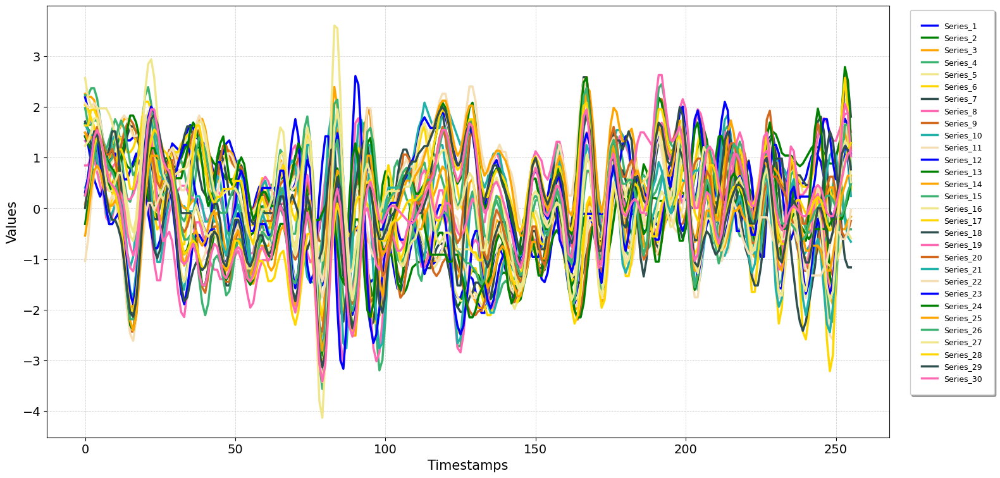

In [6]:
# load the dataset from the library
ts.load_series(utils.search_path("eeg-alcohol"))
ts.plot(input_data=ts.data, nbr_series=30, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **Electricity** dataset has data on household energy consumption of 370 individual clients collected every minute between 2006 and 2010 in France (obtained from the UCI repository).


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/electricity.txt

> logs: normalization (z_score) of the data - runtime: 0.0015 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_18_imputegap_plot.jpg


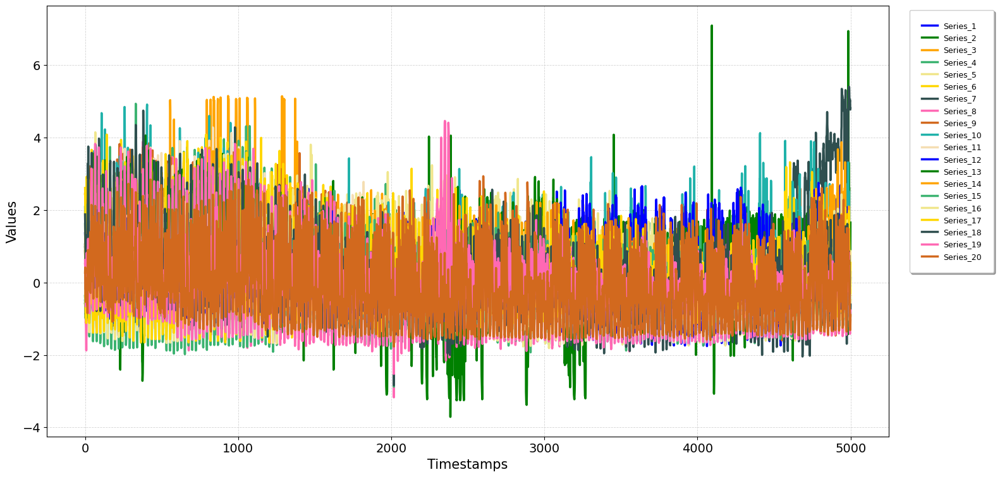

In [7]:
# load the dataset from the library
ts.load_series(utils.search_path("electricity"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **Soccer** dataset, initially presented in the DEBS Challenge 2013, captures player positions during a football match. The data is collected from sensors placed near players' shoes and the goalkeeper's hands. With a high tracking frequency of 200Hz, it generates 15,000 position events per second. Soccer time series exhibit bursty behavior and contain numerous outliers.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/soccer.txt

> logs: normalization (z_score) of the data - runtime: 0.0230 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_23_imputegap_plot.jpg


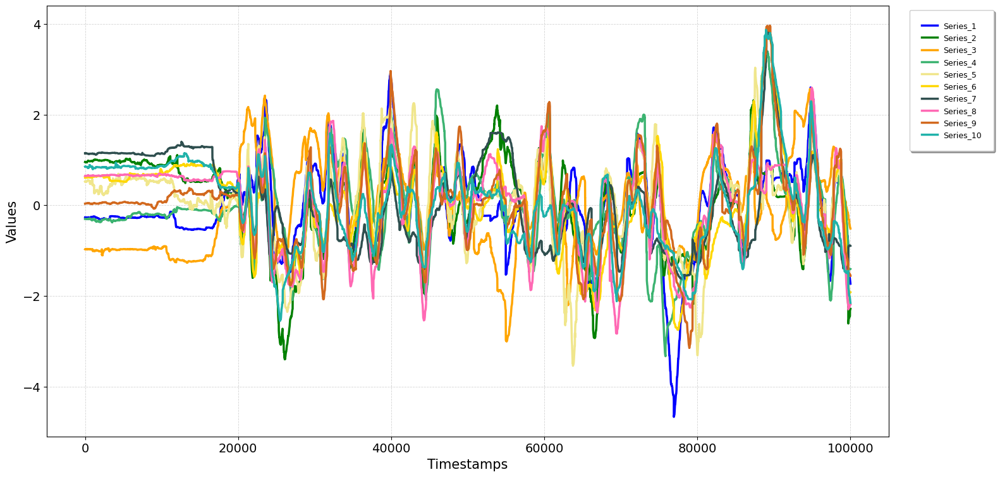

In [8]:
# load the dataset from the library
ts.load_series(utils.search_path("soccer"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **Stock-exchange** dataset contains collection of the daily exchange rates of eight foreign countries including Australia, British, Canada, Switzerland, China, Japan, New Zealand and Singapore ranging from 1990 to 2016.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/stock-exchange.txt

> logs: normalization (z_score) of the data - runtime: 0.0016 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_27_imputegap_plot.jpg


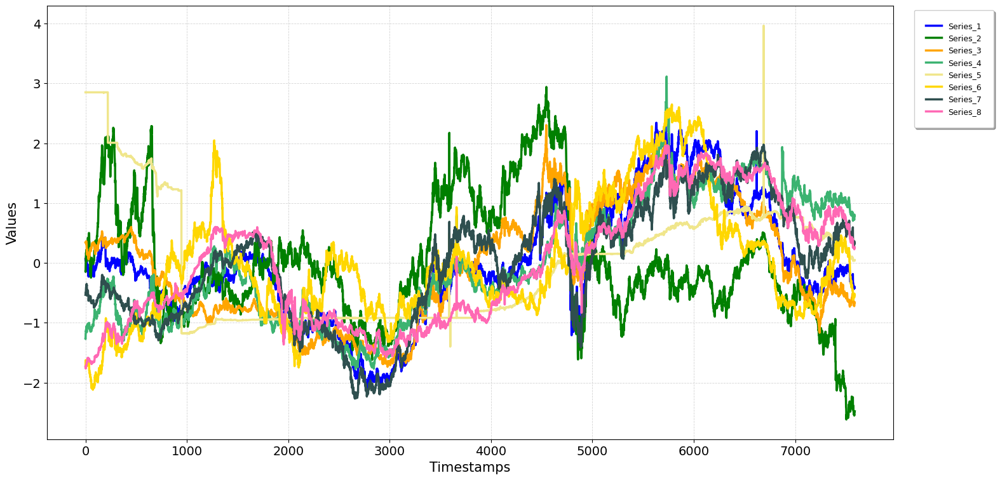

In [9]:
# load the dataset from the library
ts.load_series(utils.search_path("stock-exchange"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **Motion** dataset consists of time series data collected from accelerometer and gyroscope sensors, capturing attributes such as attitude, gravity, user acceleration, and rotation rate. Recorded at a high sampling rate of 50Hz using an iPhone 6s placed in users' front pockets, the data reflects various human activities.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/motion.txt

> logs: normalization (z_score) of the data - runtime: 0.0035 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_31_imputegap_plot.jpg


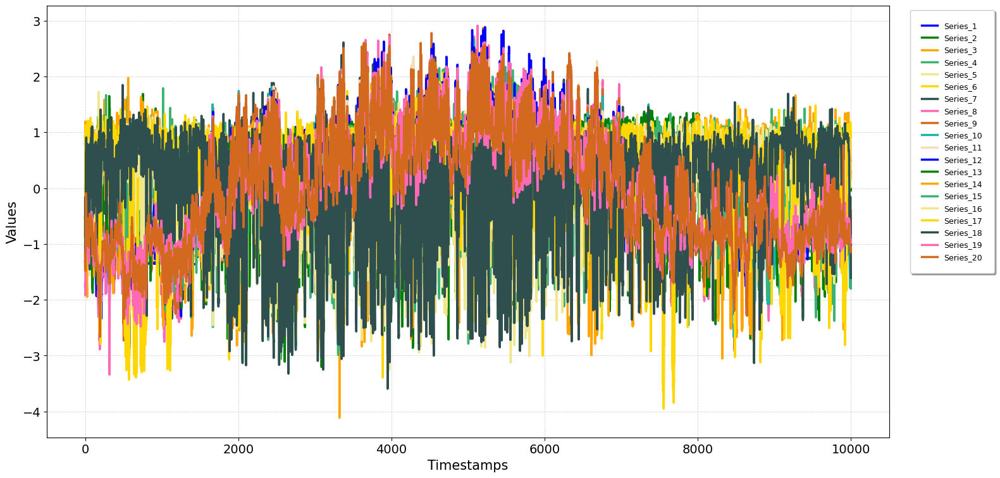

In [10]:
# load the dataset from the library
ts.load_series(utils.search_path("motion"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **Climate** dataset is an aggregated and processed collection used for climate change attribution studies. It contains observations data for 18 climate agents across 125 locations in North America USC Melady Lab. The dataset has a temporal granularity of 1 month, comprising 10 series with 5,000 values each. This structure is particularly valuable for spatio-temporal modeling Spatial-temporal causal modeling for climate change attribution, as it enables researchers to account for both spatial and temporal dependencies.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/climate.txt

> logs: normalization (z_score) of the data - runtime: 0.0011 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_35_imputegap_plot.jpg


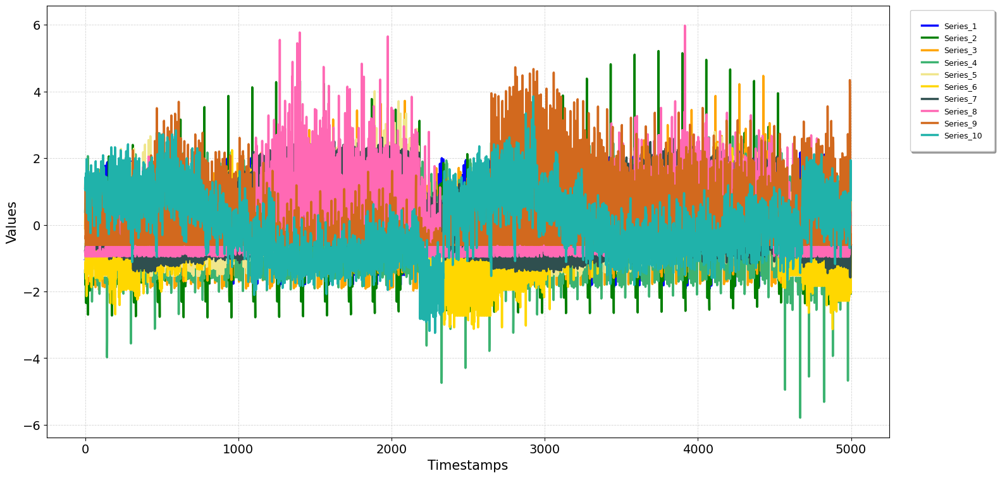

In [11]:
# load the dataset from the library
ts.load_series(utils.search_path("climate"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **Air Quality** dataset includes a subset of air quality measurements collected from 36 monitoring stations in China from 2014 to 2015.




(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/airq.txt

> logs: normalization (z_score) of the data - runtime: 0.0006 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_39_imputegap_plot.jpg


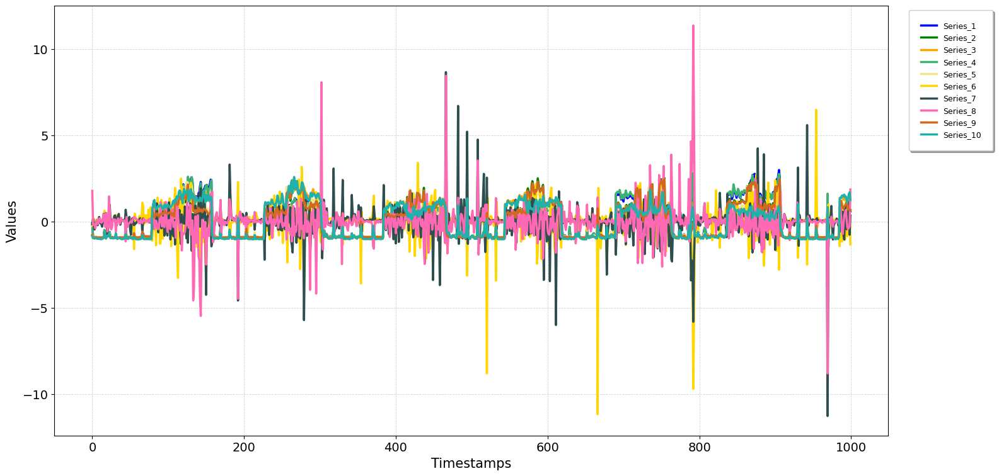

In [12]:
# load the dataset from the library
ts.load_series(utils.search_path("airq"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

The **BAFU** dataset, kindly provided by the BundesAmt Für Umwelt (the Swiss Federal Office for the Environment), contains water discharge time series collected from different Swiss rivers containing between 200k and 1.3 million values each and covers the time period from 1974 to 2015.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/bafu.txt

> logs: normalization (z_score) of the data - runtime: 0.0187 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_44_imputegap_plot.jpg


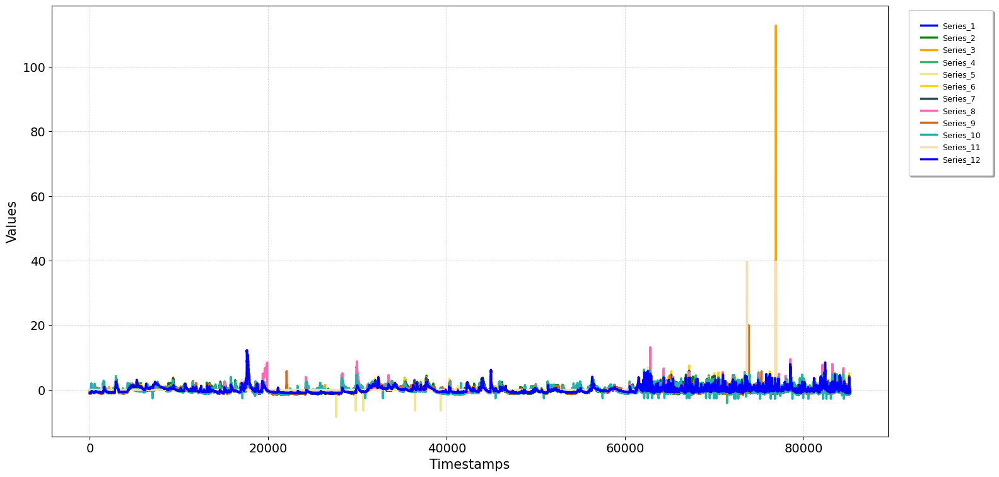

In [13]:
# load the dataset from the library
ts.load_series(utils.search_path("bafu"))
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

## 2.2&nbsp;Plotting Customization

The functions `print()` or `plot()`, provided by the manager object TimesSeries, allow to display numerically or visually the different time series.

In [14]:
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the dataset from the library
ts.load_series(utils.search_path("bafu"))

# print a subset of time series
ts.print()


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/bafu.txt

> logs: normalization (z_score) of the data - runtime: 0.0174 seconds

shape of bafu : (85203, 12)
	number of series		= 12
	number of timestamps	= 85203

                  series_0       series_1       series_2       series_3       series_4       series_5       series_6       
timestamp_1      -1.1986480799  -0.9785036738  -0.1106393112  -0.4123336415  -0.8415498034  -0.7641010673  -0.8642578888
timestamp_2      -1.2022828591  -0.9823556731  -0.1090280722  -0.4123336415  -0.8415498034  -0.7520748095  -0.8665796950
timestamp_3      -1.1986480799  -0.9785036738  -0.1080613288  -0.4188661076  -0.8388987152  -0.7580879384  -0.8689015013
timestamp_4      -1.1986480799  -0.9785036738  -0.1077390811  -0.4188661076  -0.8442008915  -0.7661054436  -0.8712233075
timestamp_5      -1.1950133007  -

The `load_series` function allows to filter the number of series and the number of values of the time series. The same functionality can be used directly at the plotting level.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/bafu.txt

> logs: normalization (z_score) of the data - runtime: 0.0172 seconds

plots saved in: ./imputegap_assets/26_01_22_15_49_59_imputegap_plot.jpg


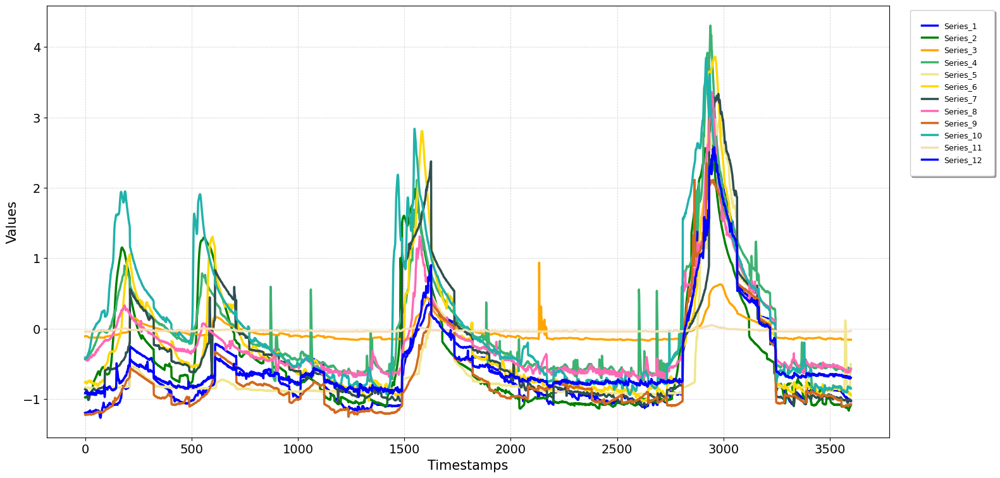

In [15]:
# load and normalize the dataset from the library
ts.load_series(utils.search_path("bafu"))
ts.plot(input_data=ts.data, nbr_val=3600, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/bafu.txt

> logs: normalization (z_score) of the data - runtime: 0.0269 seconds

plots saved in: ./imputegap_assets/26_01_22_15_50_04_imputegap_plot.jpg


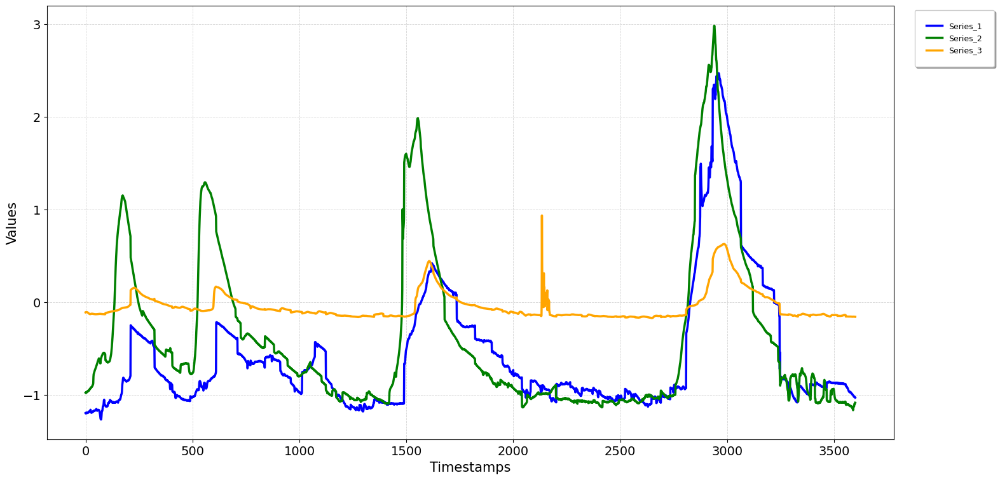

In [16]:
# load the BAFU dataset from the library
ts.load_series(utils.search_path("bafu"))
ts.plot(input_data=ts.data, nbr_series=3, nbr_val=3600, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

## 2.3&nbsp;Load as a Matrix

To import the time series as a matrix, add it to the ``ts.import_matrix`` function:

In [17]:
from imputegap.recovery.manager import TimeSeries
ts = TimeSeries()
mat = [[2,3,9], [3,10,5], [-1,4,5], [0,0,0]]
ts.import_matrix(mat)

imputegap_jupyter(ts.data)


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)



,0,1,2
1,2,3,9
2,3,10,5
3,-1,4,5
4,0,0,0



plots saved in: ./imputegap_assets/26_01_22_15_50_10_imputegap_plot.jpg


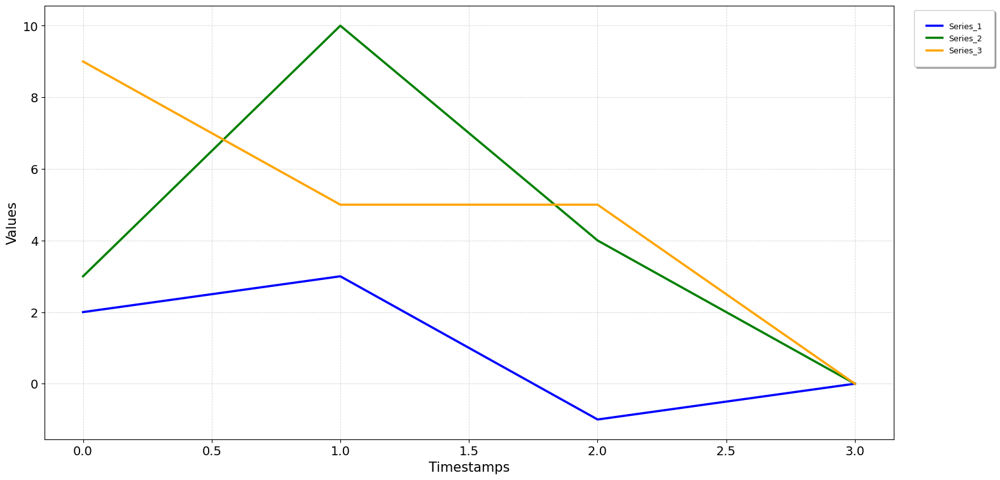

In [18]:
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

## 2.4&nbsp;Load External Datasets

To load your own dataset, add the path to your file in the ``ts.load_series`` function:

In [20]:
from imputegap.recovery.manager import TimeSeries
ts = TimeSeries()
ts.load_series("test.txt")  # PATH of your dataset

imputegap_jupyter(ts.data)


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/test.txt

> logs: normalization (z_score) of the data - runtime: 0.0004 seconds


,0,1,2,3,4,5,6,7,8,9
1,-0.51,-0.26,-2.10,-1.24,-0.97,-1.06,0.41,-0.01,-0.63,-2.28
2,1.58,-0.92,1.70,1.80,1.82,1.57,1.55,-0.01,-0.63,-2.28
3,-0.51,-0.70,1.57,1.64,1.66,1.72,0.41,-0.01,-0.63,-0.24
4,1.58,-0.48,1.43,1.48,1.50,1.26,1.66,-0.01,-0.63,-0.24
5,-0.51,0.63,1.29,1.32,1.33,0.02,-0.05,-0.01,-0.63,-1.26
6,0.54,0.85,1.16,1.16,1.17,1.57,-0.05,-0.01,1.27,0.78
7,0.54,-1.36,1.02,1.00,1.00,1.72,1.09,-0.01,1.51,-1.05
8,0.54,-1.36,0.89,0.84,0.84,0.49,1.09,-0.01,1.74,0.58
9,0.54,-1.36,0.61,0.68,0.67,0.33,-0.05,3.45,1.98,-1.26
10,0.54,-1.36,0.48,0.52,0.51,1.72,0.07,-3.47,1.74,0.78



plots saved in: ./imputegap_assets/26_01_22_15_50_26_imputegap_plot.jpg


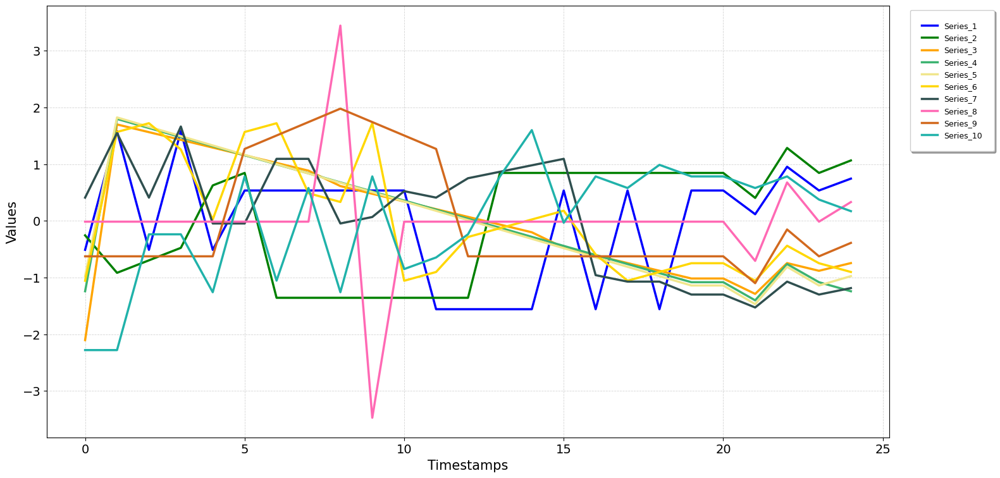

In [21]:
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

## 2.5&nbsp;Data Preprocessing


The time series datasets can be normalized before being used. This step can have a drastic impact on the performance of some imputation algorithms.


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/bafu.txt

> logs: normalization (z_score) of the data - runtime: 0.0011 seconds
> logs: normalization (z_score) of the data - runtime: 0.0005 seconds

plots saved in: ./imputegap_assets/26_01_22_15_50_30_imputegap_plot.jpg


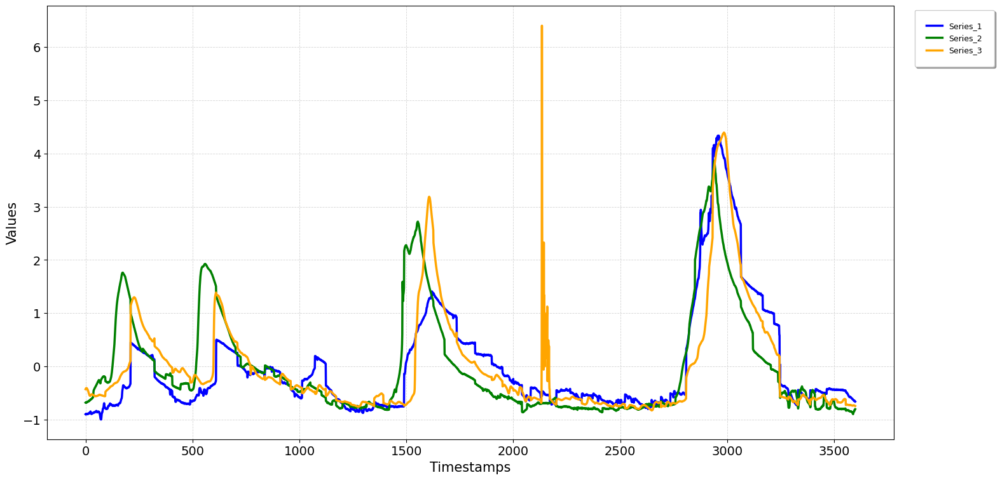

In [22]:
# load and normalize the dataset from the library
ts.load_series(utils.search_path("bafu"), nbr_series=3, nbr_val=3600)
ts.normalize(normalizer="z_score")
ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

Extend your normalizer to your implementation or any APIs such as sklearn


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/bafu.txt

> logs: normalization (z_score) of the data - runtime: 0.0009 seconds

plots saved in: ./imputegap_assets/26_01_22_15_50_34_imputegap_plot.jpg


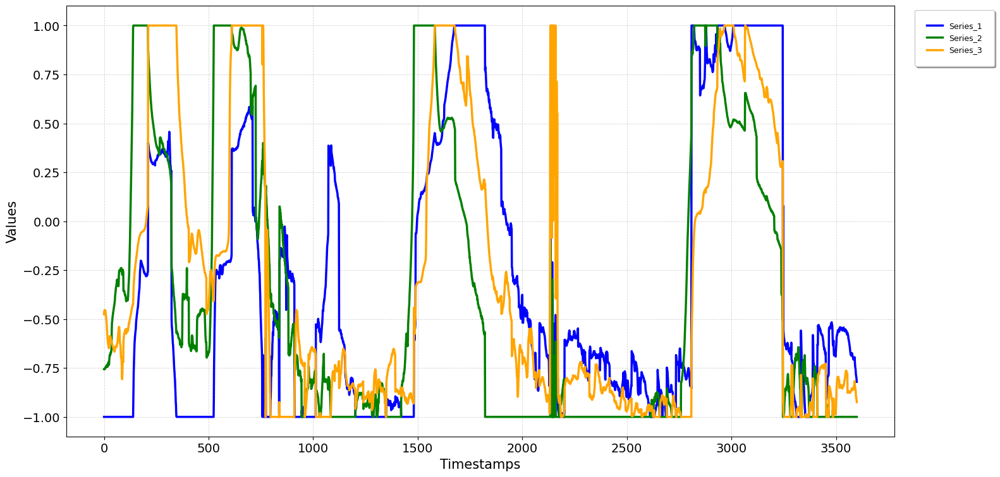

In [23]:
from sklearn.preprocessing import maxabs_scale

ts = TimeSeries()
ts.load_series(utils.search_path("bafu"), nbr_series=3, nbr_val=3600)

ts.data = maxabs_scale(ts.data, axis=1)

ts.plot(input_data=ts.data, save_path="./imputegap_assets")
%matplotlib inline
ts.plots.show()

<br>


# 3.&nbsp;Synthetic Missing Data Injection

We now describe how to simulate missing values in the loaded dataset. ImputeGAP implements seven different missingness patterns. We will illustrate how to contaminate the BAFU dataset with each of those missigness patterns:

All the patterns are available in the ``ts.patterns`` module. They can be listed as follows:

In [24]:
ts.patterns

['aligned',
 'disjoint',
 'distribution',
 'gaussian',
 'mcar',
 'overlap',
 'scattered']

## 3.1&nbsp;MCAR Pattern

The MCAR (Missing Completely At Random) pattern introduces missing value blocks of a specified size at random positions across multiple series, continuing until the user-defined missing value percentage is met. The MCAR pattern can be simulated as follows:

In [38]:
def clean_display(ts):
    ts.shift(1, 4)
    ts.shift(2, -4)
    ts.range(3500, 7000)
    ts.data = ts.data[:, [2, 0, 1]]
    return ts

In [46]:
from imputegap.recovery.manager import TimeSeries
from imputegap.recovery.contamination import GenGap
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the dataset
ts.load_series(utils.search_path("eeg-alcohol"), normalizer="z-score", nbr_val=250, nbr_series=3)
ts = clean_display(ts)

# contaminate the time series with MCAR pattern
ts_m = GenGap.mcar(ts.data, rate_dataset=1, rate_series=0.2, block_size=10, offset=25, seed=True)


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/eeg-alcohol.txt

> logs: normalization (z_score) of the data - runtime: 0.0003 seconds
(SYS) Time series 1 data as been shift by: 4
(SYS) Time series 2 data as been shift by: -4
(ERR) The series 7000 has no data.

(CONT) missigness pattern: MCAR
	selected series: 1, 2, 3
	percentage of contaminated series: 100%
	rate of missing data per series: 20.0%
	block size: 10
	security offset: [0-25]
	seed value: 42



<br>


In [47]:
imputegap_jupyter(ts_m)

,0,1,2
1,-1.73,2.23,5.72
2,-1.79,1.99,5.62
3,-1.79,1.74,5.51
4,-1.85,1.62,5.35
5,-2.10,1.43,5.14
6,-2.41,1.25,4.82
7,-2.72,1.01,4.66
8,-2.85,0.88,4.66
9,-2.85,0.95,4.82
10,-2.72,1.13,5.14


<br>



plots saved in: ./imputegap_assets/contamination/26_01_22_15_58_10_imputegap_plot.jpg


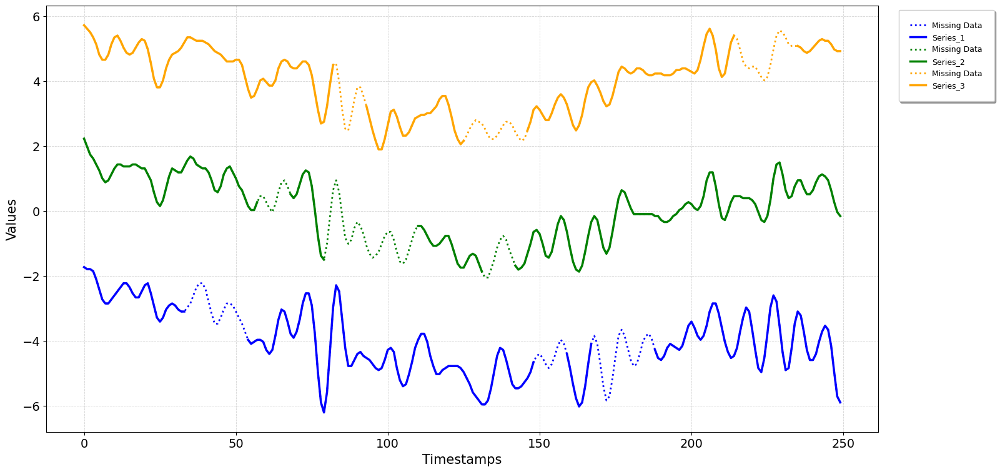

In [48]:
ts.plot(ts.data, ts_m, nbr_series=4, subplot=False, save_path="./imputegap_assets/contamination")
%matplotlib inline
ts.plots.show()

 ## 3.2&nbsp;Distribution Pattern

Now, we will simulate missing blocks that a follow a statistical distribution. We will ilustrate the contamination using a Gaussian distribution.


(CONT) missigness pattern: GAUSSIAN
	percentage of contaminated series: 100%
	rate of missing data per series: 40.0%
	security offset: [0-25]
	seed value: 42
	mean strategy : position
	standard deviation : 0.2


plots saved in: ./imputegap_assets/contamination/26_01_22_15_58_36_imputegap_plot.jpg


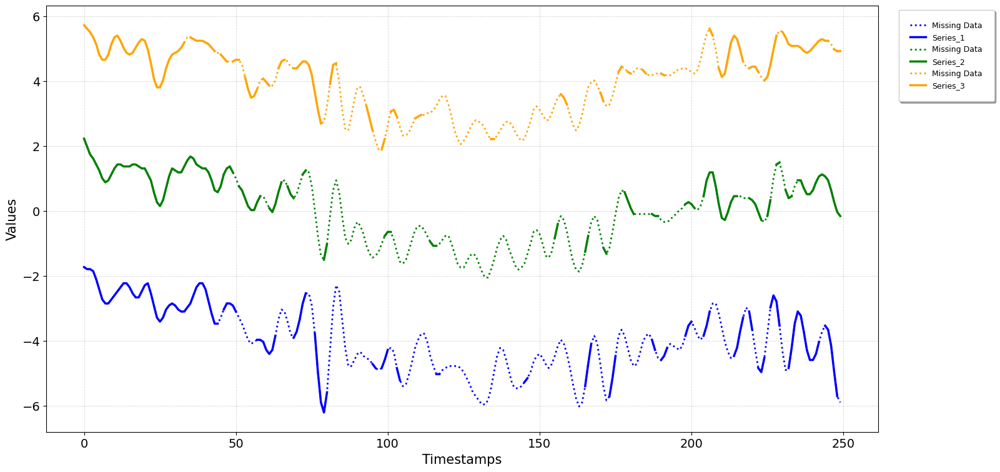

In [49]:
ts_m = GenGap.gaussian(ts.data, rate_dataset=1, rate_series=0.4, offset=25, std_dev=0.2)

ts.plot(ts.data, ts_m, nbr_series=4, subplot=False, save_path="./imputegap_assets/contamination")
%matplotlib inline
ts.plots.show()

## 3.3&nbsp;Aligned Pattern

The aligned pattern introduces a single large block of missing values into the series, with its size determined by the series rate. The missing block begins after an offset to prevent failures in certain imputation algorithms. The aligned pattern can be simulated as follows:


(CONT) missigness pattern: ALIGNED
	percentage of contaminated series: 100%
	rate of missing data per series: 40.0%
	security offset: [0-25]
	timestamps impacted : 25 -> 124
	series impacted : 0 -> 2


plots saved in: ./imputegap_assets/contamination/26_01_22_15_58_48_imputegap_plot.jpg


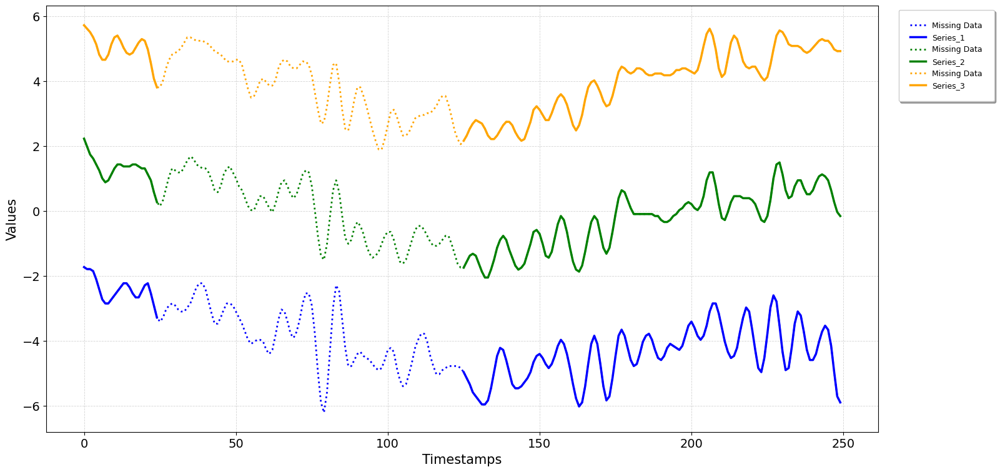

In [50]:
ts_m = GenGap.aligned(ts.data, rate_dataset=1, rate_series=0.4, offset=25)

ts.plot(ts.data, ts_m, nbr_series=4, subplot=False, save_path="./imputegap_assets/contamination")
%matplotlib inline
ts.plots.show()

## 3.4&nbsp;Scattered Pattern

The scattered pattern follows the same intuition as the aligned pattern, with the exception that its starting position is randomly defined for each contaminated series. The pattern can be simulated as follows:


(CONT) missigness pattern: SCATTER
	percentage of contaminated series: 100%
	rate of missing data per series: 40.0%
	security offset: [0-25]
	index impacted : 25 -> 125


plots saved in: ./imputegap_assets/contamination/26_01_22_15_59_01_imputegap_plot.jpg


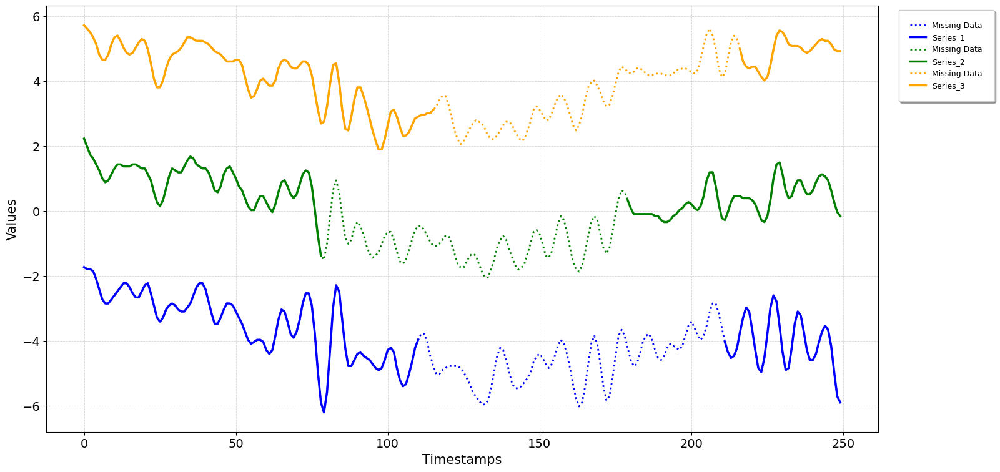

In [51]:
ts_m = GenGap.scattered(ts.data, rate_dataset=1, rate_series=0.4, offset=25)

ts.plot(ts.data, ts_m, nbr_series=4, subplot=False, save_path="./imputegap_assets/contamination")
%matplotlib inline
ts.plots.show()

## 3.5&nbsp;Disjoint Pattern

In the disjoint pattern, each series is contaminated with a specified size, and the starting point of the contamination is determined by where the previous series’ contamination ends. Disjoint simulation can be made as follows:


(CONT) missigness pattern: DISJOINT
	percentage of contaminated series: 40.0%
	rate of missing data per series: 40.0%
	security offset: [0-25]
	limit: 1


plots saved in: ./imputegap_assets/contamination/26_01_22_15_59_15_imputegap_plot.jpg


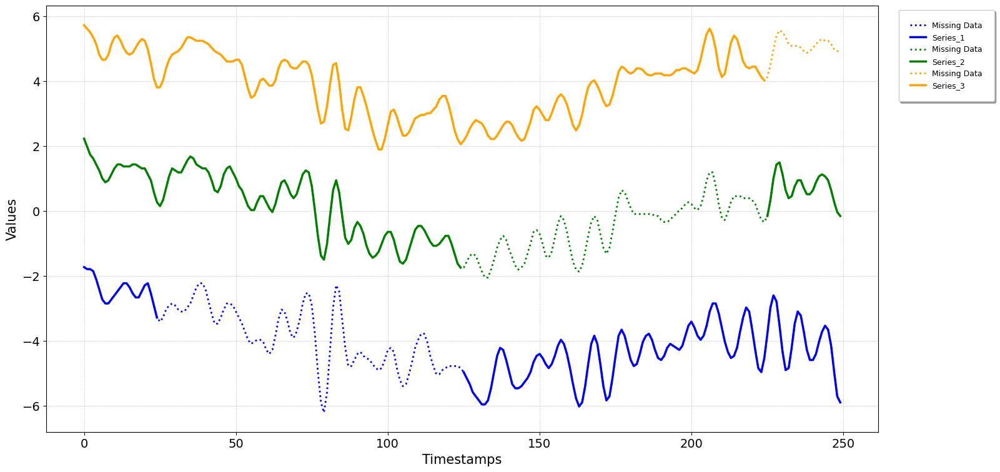

In [52]:
ts_m = GenGap.disjoint(ts.data, rate_series=0.4, offset=25)

ts.plot(ts.data, ts_m, nbr_series=4, subplot=False, save_path="./imputegap_assets/contamination")
%matplotlib inline
ts.plots.show()

## 3.6&nbsp;Overlap Pattern

The overlap pattern follows the same intuition as the disjoint one with the exception that the starting position of each series will be shifted by a specific percentage. The overlap pattern can be simulated as follows:


(CONT) missigness pattern: OVERLAP
	percentage of contaminated series: 40.0%
	rate of missing data per series: 40.0%
	security offset: [0-25]
	shift: 10.0 %
	limit: 1


plots saved in: ./imputegap_assets/contamination/26_01_22_15_59_49_imputegap_plot.jpg


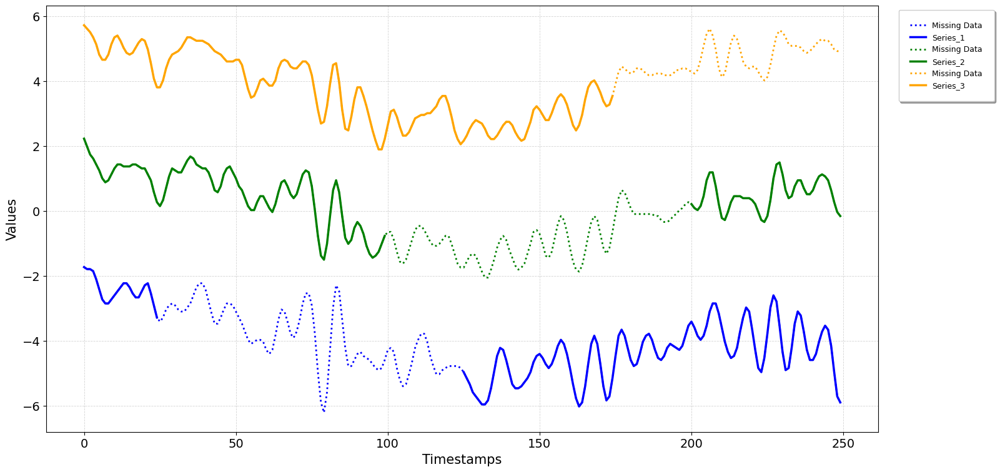

In [55]:
ts_m = GenGap.overlap(ts.data, rate_series=0.4, offset=0.1, shift=0.1)

ts.plot(ts.data, ts_m, nbr_series=4, subplot=False, save_path="./imputegap_assets/contamination")
%matplotlib inline
ts.plots.show()

<br>


<br>


# 4.&nbsp;Imputation

In this section, we will illustrate how to impute the contaminated time series. Our library implements five families of imputation algorithms: Statistical, Machine Learning, Matrix Completion, Deep Learning, and Pattern Search.

All algorithms developed in ImputeGAP are available in the ``ts.algorithms`` module, which can be listed as follows:


In [56]:
ts.algorithms_with_families

['DeepLearning.BRITS',
 'DeepLearning.BayOTIDE',
 'DeepLearning.BitGraph',
 'DeepLearning.CSDI',
 'DeepLearning.DeepMVI',
 'DeepLearning.GAIN',
 'DeepLearning.GRIN',
 'DeepLearning.HKMFT',
 'DeepLearning.MPIN',
 'DeepLearning.MRNN',
 'DeepLearning.MissNet',
 'DeepLearning.PRISTI',
 'DeepLearning.SAITS',
 'DeepLearning.TimesNet',
 'LLMs.GPT4TS',
 'LLMs.NuwaTS',
 'MachineLearning.IIM',
 'MachineLearning.MICE',
 'MachineLearning.MissForest',
 'MachineLearning.XGBOOST',
 'MatrixCompletion.CDRec',
 'MatrixCompletion.GROUSE',
 'MatrixCompletion.IterativeSVD',
 'MatrixCompletion.ROSL',
 'MatrixCompletion.SPIRIT',
 'MatrixCompletion.SVT',
 'MatrixCompletion.SoftImpute',
 'MatrixCompletion.TRMF',
 'PatternSearch.DynaMMo',
 'PatternSearch.STMVL',
 'PatternSearch.TKCM',
 'Statistics.Interpolation',
 'Statistics.KNNImpute',
 'Statistics.MeanImpute',
 'Statistics.MeanImputeBySeries',
 'Statistics.MinImpute',
 'Statistics.ZeroImpute']

We will illusrate the imputation performed by the CDRec technique from Matrix Completion of the BAFU datat with MCAR missing blocks.


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


Imputation algorithms : ['BRITS', 'BayOTIDE', 'BitGraph', 'CDRec', 'CSDI', 'DeepMVI', 'DynaMMo', 'GAIN', 'GPT4TS', 'GRIN', 'GROUSE', 'HKMFT', 'IIM', 'Interpolation', 'IterativeSVD', 'KNNImpute', 'MICE', 'MPIN', 'MRNN', 'MeanImpute', 'MeanImputeBySeries', 'MinImpute', 'MissForest', 'MissNet', 'NuwaTS', 'PRISTI', 'ROSL', 'SAITS', 'SPIRIT', 'STMVL', 'SVT', 'SoftImpute', 'TKCM', 'TRMF', 'TimesNet', 'XGBOOST', 'ZeroImpute']

(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/chlorine.txt

> logs: normalization (z_score) of the data - runtime: 0.0009 seconds

(CONT) missigness pattern: MCAR
	selected series: 14, 18, 20, 26, 27, 31, 33, 40, 46, 49
	percentage of contaminated series: 20.0%
	rate of missing data per series: 20.0%
	block size: 10
	security offset: [0-100]
	seed value: 42


(IMPUTATION) CDRec
	Matrix: 1000, 50
	truncation rank: 3
	epsilon

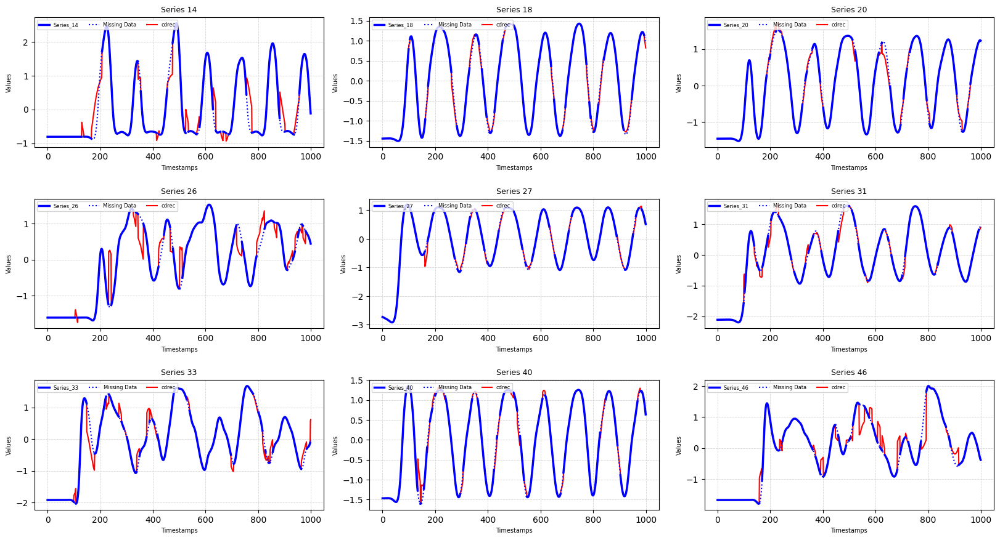

In [57]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()
print(f"\nImputation algorithms : {ts.algorithms}")

# load and normalize the dataset
ts.load_series(utils.search_path("chlorine"), normalizer="z_score")

# contaminate the time series
ts_m = GenGap.mcar(ts.data)

# impute the contaminated series
imputer = Imputation.MatrixCompletion.CDRec(ts_m)
imputer.impute()

# compute and print the imputation metrics
imputer.score(ts.data, imputer.recov_data)
ts.print_results(imputer.metrics)


# plot the recovered time series
ts.plot(input_data=ts.data, incomp_data=ts_m, recov_data=imputer.recov_data, nbr_series=9, subplot=True, algorithm=imputer.algorithm, save_path="./imputegap_assets/imputation")
%matplotlib inline
ts.plots.show()

<br>


Now, let's see the result for a new pattern of contamination.


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/chlorine.txt

> logs: normalization (z_score) of the data - runtime: 0.0006 seconds

(CONT) missigness pattern: ALIGNED
	percentage of contaminated series: 20.0%
	rate of missing data per series: 20.0%
	security offset: [0-100]
	timestamps impacted : 100 -> 299
	series impacted : 0 -> 9


(IMPUTATION) CDRec
	Matrix: 1000, 50
	truncation rank: 3
	epsilon: 1e-06
	iterations: 100

call: cdrec.impute(params={'rank': 3, 'epsilon': 1e-06, 'iterations': 100})

> logs: imputation cdrec - Execution Time: 1.0993 seconds.

Results :
RMSE                 = 0.6189010710904136
MAE                  = 0.48443481948476097
MI                   = 0.7492599541483888
CORRELATION          = 0.7649695533613601

plots saved in: ./imputegap_assets/imputation/26_01_22_16_01_00_cdrec_plot.jpg


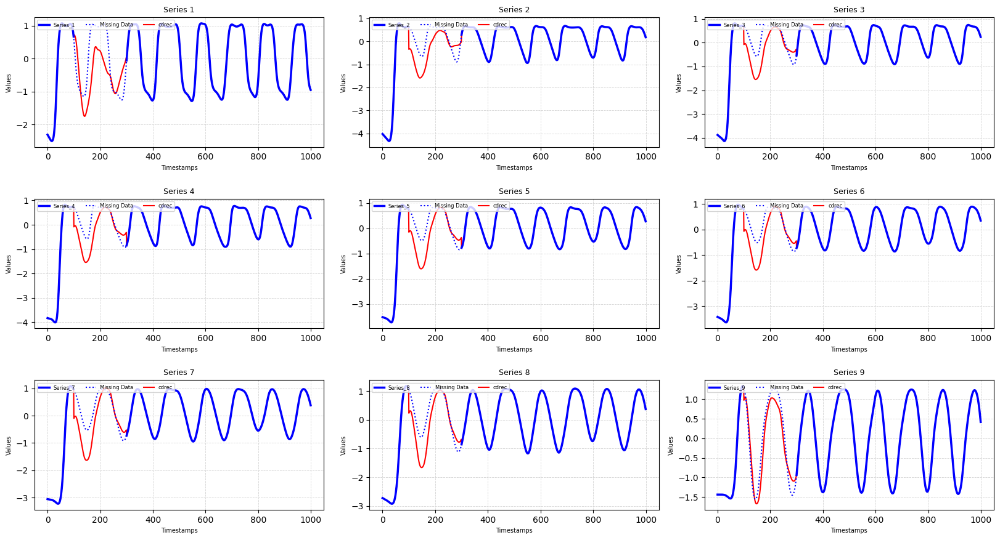

In [58]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the dataset
ts.load_series(utils.search_path("chlorine"), normalizer="z_score")

# contaminate the time series
ts_m = GenGap.aligned(ts.data)

# impute the contaminated series
imputer = Imputation.MatrixCompletion.CDRec(ts_m)
imputer.impute()

# compute and print the imputation metrics
imputer.score(ts.data, imputer.recov_data)
ts.print_results(imputer.metrics)

# plot the recovered time series
ts.plot(input_data=ts.data, incomp_data=ts_m, recov_data=imputer.recov_data, nbr_series=9, subplot=True, algorithm=imputer.algorithm, save_path="./imputegap_assets/imputation")
%matplotlib inline
ts.plots.show()

<br>


In [59]:
imputegap_jupyter(imputer.recov_data)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
1,-2.31,-4.02,-3.88,-3.83,-3.51,-3.42,-3.06,-2.72,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.73,-2.70,-2.68,-2.24,-2.12,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
2,-2.33,-4.03,-3.89,-3.84,-3.52,-3.43,-3.06,-2.73,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.73,-2.70,-2.68,-2.24,-2.12,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
3,-2.34,-4.05,-3.90,-3.84,-3.52,-3.43,-3.06,-2.73,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.73,-2.70,-2.68,-2.24,-2.12,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
4,-2.35,-4.06,-3.91,-3.84,-3.53,-3.44,-3.06,-2.74,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.74,-2.70,-2.68,-2.24,-2.12,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
5,-2.37,-4.07,-3.92,-3.84,-3.53,-3.44,-3.07,-2.74,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.74,-2.70,-2.68,-2.24,-2.11,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
6,-2.38,-4.08,-3.93,-3.85,-3.53,-3.45,-3.07,-2.75,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.75,-2.70,-2.69,-2.24,-2.11,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
7,-2.40,-4.10,-3.93,-3.85,-3.54,-3.45,-3.07,-2.75,-1.44,-1.37,-1.20,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.75,-2.70,-2.69,-2.24,-2.11,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.47,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
8,-2.41,-4.11,-3.94,-3.85,-3.54,-3.46,-3.07,-2.76,-1.44,-1.37,-1.19,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.76,-2.70,-2.69,-2.24,-2.11,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.46,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
9,-2.42,-4.12,-3.95,-3.86,-3.54,-3.46,-3.07,-2.76,-1.44,-1.37,-1.19,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.76,-2.70,-2.69,-2.24,-2.11,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.46,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65
10,-2.44,-4.13,-3.96,-3.86,-3.55,-3.47,-3.07,-2.77,-1.44,-1.37,-1.19,-1.01,-0.84,-0.81,-1.47,-1.47,-1.48,-1.44,-1.48,-1.46,-1.50,-1.55,-1.56,-1.48,-1.74,-1.60,-2.77,-2.70,-2.69,-2.24,-2.11,-1.99,-1.92,-1.85,-1.85,-1.72,-1.56,-1.49,-1.41,-1.46,-1.40,-1.42,-1.49,-2.00,-1.82,-1.67,-1.60,-1.60,-1.55,-1.65


<br>


# 5.&nbsp;AutoML Parameter Tuning

mputeGAP includes a component for managing algorithm configuration and hyperparameter tuning. This component leverages various AutoML optimizers (search algorithms) to perform parameter optimization.


All the optimizers provided by the library are accessible through the `ts.optimizers` module and include the following:

In [60]:
ts.optimizers

['bayesian', 'greedy', 'particle_swarm', 'ray_tune', 'successive_halving']

Parameters are specified by supplying a dictionary that includes the ground truth, the selected optimizer, and the corresponding optimizer options.

## 5.1&nbsp;Bayesian Optimization

We illustre the parameter tuning using the Bayesian Optimization (BO) technique.

In [61]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the dataset
ts.load_series(utils.search_path("chlorine"), normalizer="z_score")

# contaminate and impute the time series
ts_m = GenGap.mcar(ts.data)
imputer = Imputation.MatrixCompletion.CDRec(ts_m)

# use Ray Tune to fine tune the imputation algorithm
imputer.impute(user_def=False, params={"input_data": ts.data, "optimizer": "bayesian"})


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/chlorine.txt

> logs: normalization (z_score) of the data - runtime: 0.0010 seconds

(CONT) missigness pattern: MCAR
	selected series: 14, 18, 20, 26, 27, 31, 33, 40, 46, 49
	percentage of contaminated series: 20.0%
	rate of missing data per series: 20.0%
	block size: 10
	security offset: [0-100]
	seed value: 42


(OPTI) optimizer bayesian has been called with cdrec ...


(IMPUTATION) CDRec
	Matrix: 1000, 50
	truncation rank: 8
	epsilon: 0.00015566861063982882
	iterations: 857

call: cdrec.impute(params={'rank': 8, 'epsilon': 0.00015566861063982882, 'iterations': 857})


(IMPUTATION) CDRec
	Matrix: 1000, 50
	truncation rank: 5
	epsilon: 0.2569137669362513
	iterations: 934

call: cdrec.impute(params={'rank': 5, 'epsilon': 0.2569137669362513, 'iterations': 934})


> logs: optimization bayesian - 

In [62]:
imputer.parameters

(np.int64(8), 0.00015566861063982882, np.int64(857))

In [64]:
# compute the imputation metrics with optimized parameter values
imputer.score(ts.data, imputer.recov_data)

# compute the imputation metrics with default parameter values
imputer_def = Imputation.MatrixCompletion.CDRec(ts_m).impute()
imputer_def.score(ts.data, imputer_def.recov_data)

# print the imputation metrics with default and optimized parameter values
ts.print_results(imputer_def.metrics, text="Default values")
ts.print_results(imputer.metrics, text="Optimized values")

# save hyperparameters
utils.save_optimization(optimal_params=imputer.parameters, algorithm=imputer.algorithm, dataset="eeg-alcohol", optimizer="ray_tune")


(IMPUTATION) CDRec
	Matrix: 1000, 50
	truncation rank: 3
	epsilon: 1e-06
	iterations: 100

call: cdrec.impute(params={'rank': 3, 'epsilon': 1e-06, 'iterations': 100})

> logs: imputation cdrec - Execution Time: 0.6227 seconds.

Default values :
RMSE                 = 0.3898293614344092
MAE                  = 0.27122470306259755
MI                   = 0.7911691149428601
CORRELATION          = 0.8867715479958121

Optimized values :
RMSE                 = 0.23198226540006392
MAE                  = 0.15493536958322762
MI                   = 1.1169928976747936
CORRELATION          = 0.9614361726672848

(SYS) An error occurred while saving the file: [Errno 2] No such file or directory: '/mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/imputegap_assets/params/optimal_parameters_ray_tune_eegalcohol_cdrec.toml'


'/mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/imputegap_assets/params/optimal_parameters_ray_tune_eegalcohol_cdrec.toml'

## 5.1&nbsp;Ray Tune

The library also supports integration with the popular Ray Tune framework.



In [ ]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the dataset
ts.load_series(utils.search_path("chlorine"), normalizer="z_score")

# contaminate and impute the time series
ts_m = GenGap.mcar(ts.data)
imputer = Imputation.MatrixCompletion.CDRec(ts_m)

# use Ray Tune to fine tune the imputation algorithm
imputer.impute(user_def=False, params={"input_data": ts.data, "optimizer": "ray_tune"})

In [66]:
# compute the imputation metrics with optimized parameter values
imputer.score(ts.data, imputer.recov_data)

# compute the imputation metrics with default parameter values
imputer_def = Imputation.MatrixCompletion.CDRec(ts_m).impute()
imputer_def.score(ts.data, imputer_def.recov_data)

# print the imputation metrics with default and optimized parameter values
ts.print_results(imputer_def.metrics, text="Default values")
ts.print_results(imputer.metrics, text="Optimized values")

# save hyperparameters
utils.save_optimization(optimal_params=imputer.parameters, algorithm=imputer.algorithm, dataset="eeg-alcohol", optimizer="ray_tune")


(IMPUTATION) CDRec
	Matrix: 1000, 50
	truncation rank: 3
	epsilon: 1e-06
	iterations: 100

call: cdrec.impute(params={'rank': 3, 'epsilon': 1e-06, 'iterations': 100})

> logs: imputation cdrec - Execution Time: 0.3585 seconds.

Default values :
RMSE                 = 0.3898293614344092
MAE                  = 0.27122470306259755
MI                   = 0.7911691149428601
CORRELATION          = 0.8867715479958121

Optimized values :
RMSE                 = 0.130164744158642
MAE                  = 0.0828767060175848
MI                   = 1.4257639803998015
CORRELATION          = 0.9884790763206194

(SYS) An error occurred while saving the file: [Errno 2] No such file or directory: '/mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/imputegap_assets/params/optimal_parameters_ray_tune_eegalcohol_cdrec.toml'


'/mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/imputegap_assets/params/optimal_parameters_ray_tune_eegalcohol_cdrec.toml'

The parameters used and their corresponding values can be displayed as follows:

In [67]:
imputer.parameters

(15, 0.1, 50)

<br>



plots saved in: ./imputegap_assets/imputation/26_01_22_16_09_14_cdrec_plot.jpg


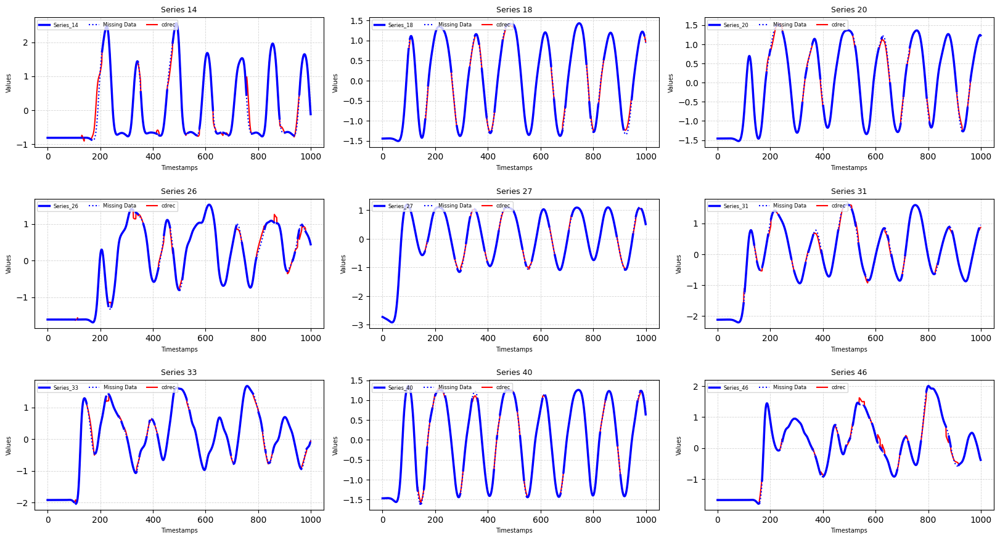

In [68]:
# plot the recovered time series
ts.plot(input_data=ts.data, incomp_data=ts_m, recov_data=imputer.recov_data, nbr_series=9, subplot=True, algorithm=imputer.algorithm, save_path="./imputegap_assets/imputation")

%matplotlib inline
ts.plots.show()

The range of parameter values provided to the AutoML technique can be customized as needed.

In [69]:
from ray import tune
RAYTUNE_PARAMS = {
    'cdrec': {
        "rank": tune.grid_search([i for i in range(2, 16, 1)]),
        "eps": tune.loguniform(1e-6, 1),
        "iters": tune.grid_search([i * 50 for i in range(1, 4)])
    }
}

# 6.&nbsp;Benchmarking Imputation Algorithms

ImputeGAP can serve as a common test-bed for comparing the effectiveness and efficiency of time series imputation algorithms. Users have full control over the benchmark by customizing various parameters, including the list of the algorithms to compare, the optimizer, the datasets to evaluate, the missingness patterns, the range of missing values, and the performance metrics.

## 6.2&nbsp;Benchmark with Default Parameters

The benchmarking module can be utilized as follows:

In [71]:
from imputegap.recovery.benchmark import Benchmark
from imputegap.tools import utils

my_algorithms = ["MeanImpute", "SoftImpute"]

my_opt = "default_params"

my_datasets = ["eeg-alcohol"]

my_patterns = ["mcar"]

range = [0.05, 0.1, 0.2, 0.4, 0.6, 0.8]

# launch the evaluation
bench = Benchmark()
bench.eval(algorithms=my_algorithms, datasets=my_datasets, patterns=my_patterns, x_axis=range, optimizer=my_opt)


The benchmark has been called:
	algorithms: ['MeanImpute', 'SoftImpute']
	datasets: ['eeg-alcohol']
	patterns: ['mcar']
	missing_percentages: [0.05, 0.1, 0.2, 0.4, 0.6, 0.8]
	optimizer: default_params
	normalizer: z_score
	runs: 1
	number max series: 200
	number max values: 2000


MeanImpute is tested with mcar on eeg-alcohol, started at 2026-01-22 16:09:49.
done!


SoftImpute is tested with mcar on eeg-alcohol, started at 2026-01-22 16:09:56.
done!



> logs: benchmark - Execution Time: 19.9681 seconds


eegalcohol: {mcar, RMSE, default_params}

 Rate       MeanImpute          SoftImpute     

 0.05      0.9945302343        0.5022733403    
  0.1      0.8081365539        0.3797954812    
  0.2      0.9727791074        0.4246409227    
  0.4      0.9879033826        0.4334707248    
  0.6      0.9900236459        0.4469672608    
  0.8      0.9947606840        0.4811537021    



eegalcohol: {mcar, RUNTIME[ms], default_params}

 Rate       MeanImpute          SoftImpute     

 0.05   

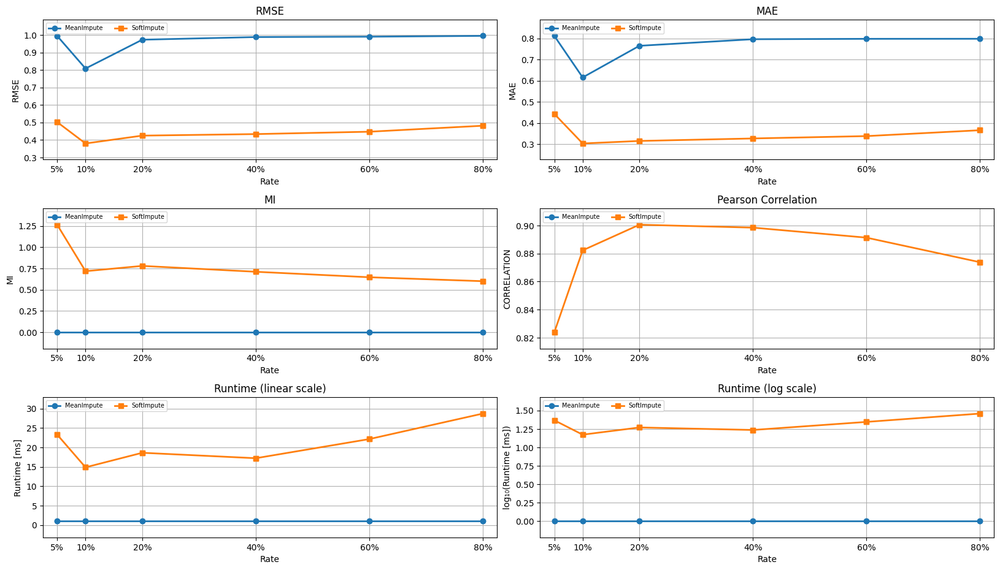

In [72]:
%matplotlib inline
bench.subplots.show()

More recent techniques such as LLMs, can be added to the benchmark. To do so, we will compare the performance of GPT4TS and CDREC, with default parameters, on the chlorine dataset contaminated with the aligned pattern.

In [73]:
from imputegap.recovery.benchmark import Benchmark

my_algorithms = ["GPT4TS", "CDRec"]

my_opt = "default_params"

my_datasets = ["chlorine"]

my_patterns = ["mcar"]

range = [0.1, 0.2]

my_metrics = ["*"]

# launch the evaluation
bench = Benchmark()
bench.eval(algorithms=my_algorithms, datasets=my_datasets, patterns=my_patterns, x_axis=range, metrics=my_metrics, optimizer=my_opt)


The benchmark has been called:
	algorithms: ['GPT4TS', 'CDRec']
	datasets: ['chlorine']
	patterns: ['mcar']
	missing_percentages: [0.1, 0.2]
	optimizer: default_params
	normalizer: z_score
	runs: 1
	number max series: 200
	number max values: 2000


GPT4TS is tested with mcar on chlorine, started at 2026-01-22 16:10:44.
done!


CDRec is tested with mcar on chlorine, started at 2026-01-22 16:12:29.
done!



> logs: benchmark - Execution Time: 109.6731 seconds


chlorine: {mcar, RMSE, default_params}

 Rate         CDRec               GPT4TS       

  0.1      0.3411154553        0.1849563179    
  0.2      0.3898293614        0.2575699106    



chlorine: {mcar, RUNTIME[ms], default_params}

 Rate         CDRec               GPT4TS       

  0.1     176.1486530304     56677.3142814636  
  0.2     231.0135364532     45951.5333175659  



The plots have been generated...


{mcar, RMSE, default_params}
--------------------------------------------------------------
   Dataset      Rate     

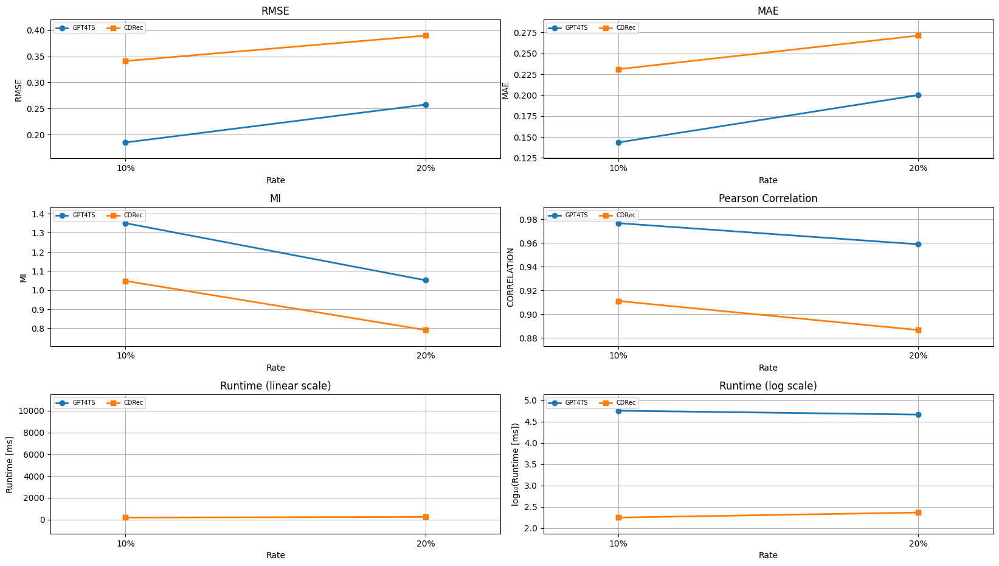

In [75]:
%matplotlib inline
bench.subplots.show()

## 6.2&nbsp;Benchmark with Optimization

In this use-case, we will compare two algorithms MeanImpute and CDRec using  Ray Tune optimizer to find the optimal parameter values.

In [ ]:
from imputegap.recovery.benchmark import Benchmark

my_algorithms = ["MeanImpute", "CDRec"]

my_opt = "ray_tune"

my_datasets = ["eeg-alcohol"]

my_patterns = ["mcar"]

range = [0.05, 0.1, 0.2, 0.4, 0.6, 0.8]

my_metrics = ["*"]

# launch the evaluation
bench = Benchmark()
bench.eval(algorithms=my_algorithms, datasets=my_datasets, patterns=my_patterns, x_axis=range, metrics=my_metrics, optimizer=my_opt, nbr_series=12, nbr_vals=100)

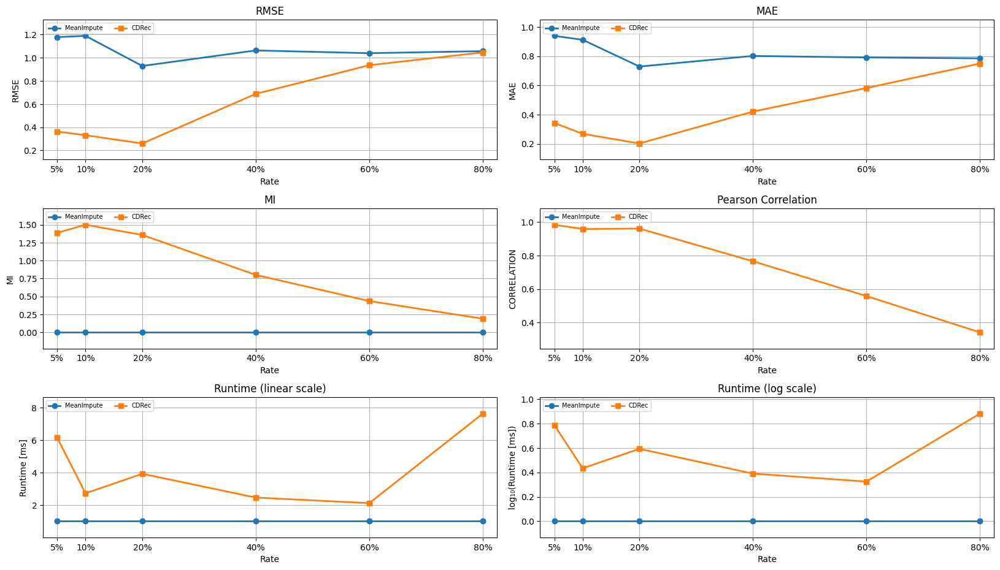

In [78]:
%matplotlib inline
bench.subplots.show()

# 7.&nbsp;Downstream Analysis


ImputeGAP includes a dedicated module for systematically evaluating the impact of data imputation on downstream tasks. Currently, forecasting is the primary supported task, with plans to expand to additional tasks in the future, such as classification and anomaly detection

All downstream models implemented in ImputeGAP are available in the `ts.forecasting_models` module and can be listed as follows:

In [79]:
ts.forecasting_models

['arima',
 'croston',
 'deepar',
 'ets',
 'exp-smoothing',
 'hw-add',
 'lightgbm',
 'lstm',
 'naive',
 'nbeats',
 'prophet',
 'sf-arima',
 'theta',
 'transformer',
 'unobs',
 'xgboost']

We show how ImputeGAP evaluates the downstream impact of CDRec in comparison to ZeroImpute (which fills missing values with zeros) on the DeepAR forecasting model.

In [80]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()
print(f"\nImputeGAP downstream models for forcasting : {ts.forecasting_models}")

# load and normalize the dataset
ts.load_series(utils.search_path("forecast-economy"), normalizer="z_score")

# contaminate the time series
ts_m = GenGap.aligned(ts.data, rate_series=0.7)

# define and impute the contaminated series
imputer = Imputation.MatrixCompletion.CDRec(ts_m)
imputer.impute()

# compute and print the downstream results
downstream_config = {"task": "forecast", "model": "prophet", "baseline": "ZeroImpute", "split": 0.8}
imputer.score(ts.data, imputer.recov_data, downstream=downstream_config)
ts.print_results(imputer.downstream_metrics, text="Downstream results")


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


ImputeGAP downstream models for forcasting : ['arima', 'croston', 'deepar', 'ets', 'exp-smoothing', 'hw-add', 'lightgbm', 'lstm', 'naive', 'nbeats', 'prophet', 'sf-arima', 'theta', 'transformer', 'unobs', 'xgboost']

(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/forecast-economy.txt

> logs: normalization (z_score) of the data - runtime: 0.0004 seconds

(CONT) missigness pattern: ALIGNED
	percentage of contaminated series: 20.0%
	rate of missing data per series: 70.0%
	security offset: [0-94]
	timestamps impacted : 94 -> 744
	series impacted : 0 -> 3


(IMPUTATION) CDRec
	Matrix: 931, 16
	truncation rank: 3
	epsilon: 1e-06
	iterations: 100

call: cdrec.impute(params={'rank': 3, 'epsilon': 1e-06, 'iterations': 100})

> logs: imputation cdrec - Execution Time: 2.0500 seconds.


(DOWNSTREAM) Default parameters of the downstream model loaded.


16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing
16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing
16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing


plots saved in:  /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/imputegap_assets/downstream

Downstream results :
MSE_original         = 0.9068209167491901
MSE_cdrec            = 0.9086036902520218
MSE_zeroimpute       = 0.9367010057574212
sMAPE_original       = 193.3773675181798
sMAPE_cdrec          = 193.52210241476573
sMAPE_zeroimpute     = 197.54965786640582


In [81]:
ts.print_results(imputer.downstream_metrics, algorithm=imputer.algorithm)


Results (cdrec) :
MSE_original         = 0.9068209167491901
MSE_cdrec            = 0.9086036902520218
MSE_zeroimpute       = 0.9367010057574212
sMAPE_original       = 193.3773675181798
sMAPE_cdrec          = 193.52210241476573
sMAPE_zeroimpute     = 197.54965786640582


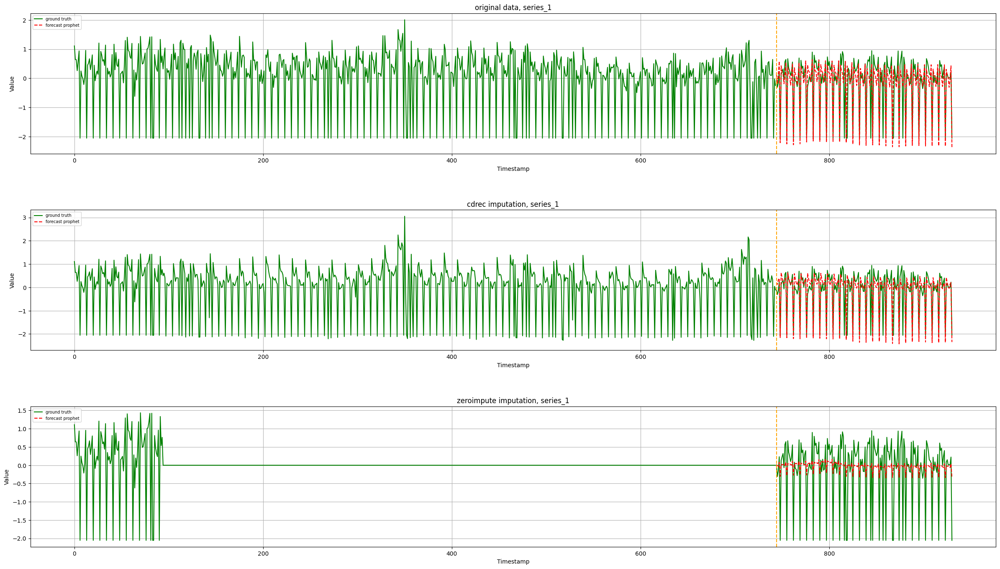

In [82]:
%matplotlib inline
imputer.downstream_plot.show()

Let's try a new forecaster

In [85]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the timeseries
ts.load_series(utils.search_path("forecast-economy"))
ts.normalize()

# contaminate the time series
ts_m = GenGap.aligned(ts.data, rate_series=0.7)

# define and impute the contaminated series
imputer = Imputation.MatrixCompletion.CDRec(ts_m)
imputer.impute()

# compute and print the downstream results
downstream_config = {"task": "forecast", "model": "lightgbm", "baseline": "ZeroImpute"}
imputer.score(ts.data, imputer.recov_data, downstream=downstream_config)
ts.print_results(imputer.downstream_metrics, algorithm=imputer.algorithm)


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/forecast-economy.txt

> logs: normalization (z_score) of the data - runtime: 0.0010 seconds
> logs: normalization (z_score) of the data - runtime: 0.0003 seconds

(CONT) missigness pattern: ALIGNED
	percentage of contaminated series: 20.0%
	rate of missing data per series: 70.0%
	security offset: [0-94]
	timestamps impacted : 94 -> 744
	series impacted : 0 -> 3


(IMPUTATION) CDRec
	Matrix: 931, 16
	truncation rank: 3
	epsilon: 1e-06
	iterations: 100

call: cdrec.impute(params={'rank': 3, 'epsilon': 1e-06, 'iterations': 100})

> logs: imputation cdrec - Execution Time: 2.6332 seconds.


(DOWNSTREAM) Default parameters of the downstream model loaded.

(DOWNSTREAM) Analysis launched !
	task: forecast
	model: lightgbm
	params: {'lags': 7, 'verbose': -1}
	base algorithm: cdrec
	reference algorithm:

In [86]:
ts.print_results(imputer.downstream_metrics, algorithm=imputer.algorithm)


Results (cdrec) :
MSE_original         = 0.28137521171347346
MSE_cdrec            = 0.834597856534711
MSE_zeroimpute       = 1.2030677902499716
sMAPE_original       = 88.76308704807344
sMAPE_cdrec          = 131.49679314775756
sMAPE_zeroimpute     = 124.92917985410949


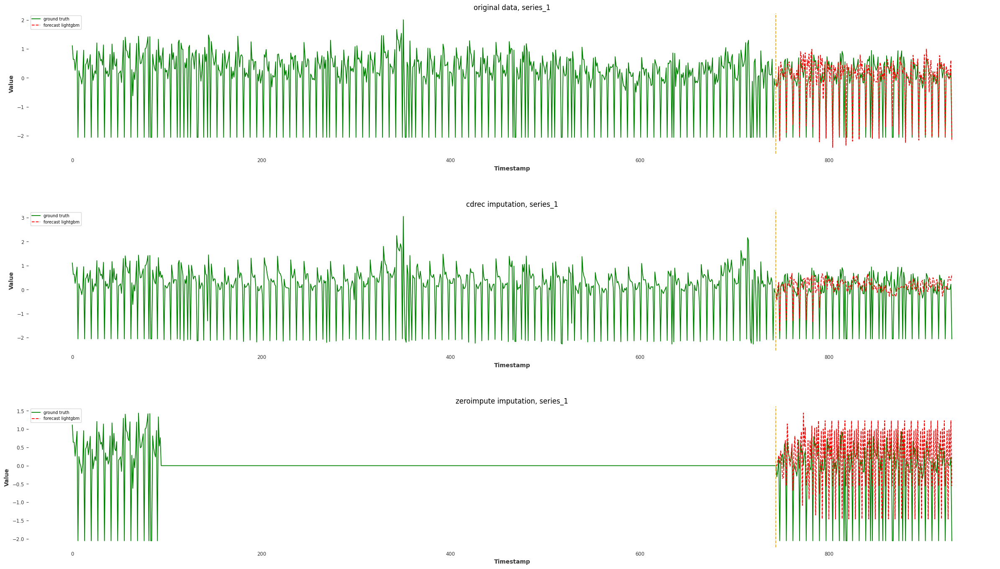

In [87]:
%matplotlib inline
imputer.downstream_plot.show()

Let's compare 2 Matri Completion algorithms

In [88]:
from imputegap.recovery.imputation import Imputation
from imputegap.recovery.contamination import GenGap
from imputegap.recovery.manager import TimeSeries
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()

# load and normalize the timeseries
ts.load_series(utils.search_path("forecast-economy"))
ts.normalize()

# contaminate the time series
ts_m = GenGap.aligned(ts.data, rate_series=0.8)

# define and impute the contaminated series
imputer = Imputation.MatrixCompletion.IterativeSVD(ts_m)
imputer.impute()

# compute and print the downstream results
downstream_config = {"task": "forecast", "model": "lightgbm", "baseline": "SoftImpute"}
imputer.score(ts.data, imputer.recov_data, downstream=downstream_config)
ts.print_results(imputer.downstream_metrics, algorithm=imputer.algorithm)


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/forecast-economy.txt

> logs: normalization (z_score) of the data - runtime: 0.0004 seconds
> logs: normalization (z_score) of the data - runtime: 0.0003 seconds

(CONT) missigness pattern: ALIGNED
	percentage of contaminated series: 20.0%
	rate of missing data per series: 80.0%
	security offset: [0-94]
	timestamps impacted : 94 -> 837
	series impacted : 0 -> 3


(SYS) Inner files loaded :  /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/env/default_values.toml 


(SYS) Wrapper files loaded for C++ :  {PosixPath('/mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/algorithms/lib/lib_iterative_svd.so')} 

		(C++) Iterative-SVD: Matrix Shape: (931, 16) for Rank 3...

> logs: imputation iterative svd - Execution Time: 0.0351 seconds



(DOWNSTREAM) Default param

In [89]:
ts.print_results(imputer.downstream_metrics, algorithm=imputer.algorithm)


Results (iterative_svd) :
MSE_original         = 0.28137521171347346
MSE_iterative_svd    = 0.6340501784940268
MSE_softimpute       = 0.7855610916367414
sMAPE_original       = 88.76308704807344
sMAPE_iterative_svd  = 102.60616615641455
sMAPE_softimpute     = 116.05473389745623


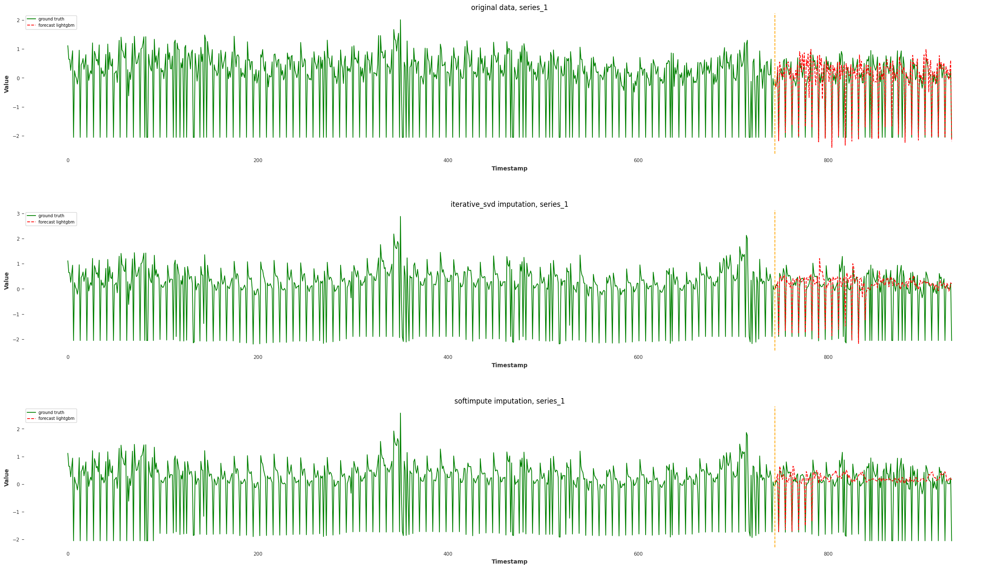

In [90]:
%matplotlib inline
imputer.downstream_plot.show()

# 8.&nbsp;Explainer

The library offers insights into algorithm behavior by identifying which features affect imputation outcomes. It trains a regression model to predict imputation results across different methods and applies SHapley Additive exPlanations (SHAP) to illustrate how various time series features influence the model’s predictions.

All feature extractors developed in ImputeGAP are available in the ``ts.extractors`` module. They can be listed as follows:

In [91]:
ts.extractors

['pycatch', 'tsfel', 'tsfresh']

## 8.1&nbsp;PyCatch22 Extractor

To begin, let's analyze the features extracted by the Pycatch22 extrator.

In [92]:
from imputegap.recovery.manager import TimeSeries
from imputegap.recovery.explainer import Explainer
from imputegap.tools import utils

# initialize the time series and explainer object
ts = TimeSeries()
exp = Explainer()
print(f"\nImputeGAP explainer features extractor : {ts.extractors}")

# load and normalize the dataset
ts.load_series(utils.search_path("eeg-alcohol"), normalizer="z_score")

# configure the explanation
exp.shap_explainer(input_data=ts.data, extractor="pycatch", pattern="mcar", file_name=ts.name, algorithm="CDRec")

# print the impact of each feature
exp.print(exp.shap_values, exp.shap_details)


ImputeGAP Library has been invoked (https://github.com/eXascaleInfolab/ImputeGAP)


ImputeGAP explainer features extractor : ['pycatch', 'tsfel', 'tsfresh']

(SYS) The dataset is loaded from /mnt/c/Users/nquen/switchdrive/MST_MasterThesis/imputegap/imputegap/datasets/eeg-alcohol.txt

> logs: normalization (z_score) of the data - runtime: 0.0005 seconds

explainer launched
	extractor: pycatch 
	imputation algorithm: CDRec 
	params: None 
	missigness pattern: mcar
	missing rate: 40.0%
	nbr of series training set: 38
	nbr of series testing set: 26


Generation  0 / 64 ( 0 %)________________________________________________________
	Contamination  0 ...
feature_name = 'DN_HistogramMode_5' (0/22) : feature_value = -0.2651558150368687
feature_name = 'DN_HistogramMode_10' (1/22) : feature_value = 0.12240744588553376
feature_name = 'CO_f1ecac' (2/22) : feature_value = 4.862960206673732
feature_name = 'CO_FirstMin_ac' (3/22) : feature_value = 1
feature_name = 'CO_HistogramAMI_even_2_5' (4/22) :

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]



	plot has been saved :  ./imputegap_assets/shap/eeg-alcohol_CDRec_pycatch_shap_all.png


	plot has been saved :  ./imputegap_assets/shap/analysis_grouped/eeg-alcohol_CDRec_pycatch_DTL_Waterfall.png


	plot has been saved :  ./imputegap_assets/shap/analysis_grouped/eeg-alcohol_CDRec_pycatch_shap_reverse.png


	plot has been saved :  ./imputegap_assets/shap/analysis_grouped/eeg-alcohol_CDRec_pycatch_DTL_Beeswarm.png


	plot has been saved :  ./imputegap_assets/shap/analysis_per_cat/eeg-alcohol_CDRec_pycatch_shap_geometry.png


	plot has been saved :  ./imputegap_assets/shap/analysis_per_cat/eeg-alcohol_CDRec_pycatch_shap_transformation.png


	plot has been saved :  ./imputegap_assets/shap/analysis_per_cat/eeg-alcohol_CDRec_pycatch_shap_correlation.png


	plot has been saved :  ./imputegap_assets/shap/analysis_per_cat/eeg-alcohol_CDRec_pycatch_shap_trend.png


	plot has been saved :  ./imputegap_assets/shap/eeg-alcohol_CDRec_pycatch_shap_cat.png


	plot has been saved :  ./imputegap_ass

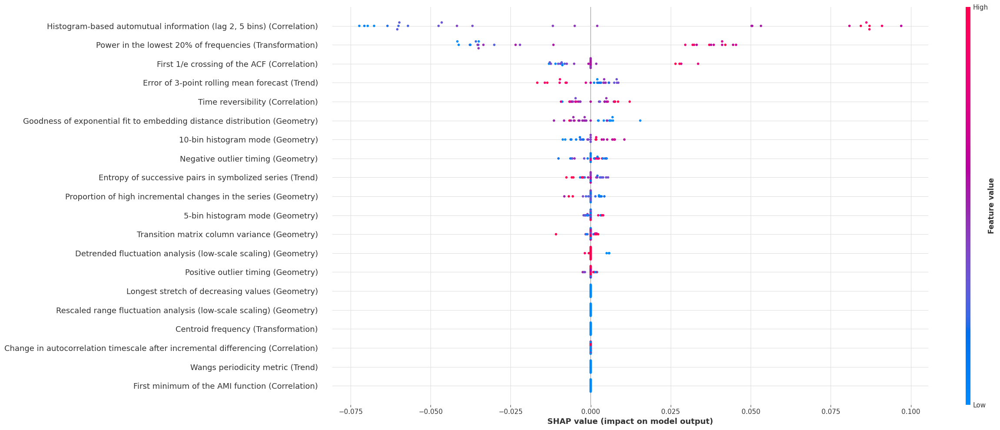

In [93]:
%matplotlib inline
exp.show()

## 8.2&nbsp;TSFEL Extractor

Let’s now see if the TSFEL extractor can provide new insights into the characteristics of the imputation.

In [ ]:
from imputegap.recovery.manager import TimeSeries
from imputegap.recovery.explainer import Explainer
from imputegap.tools import utils

# initialize the time series object
ts = TimeSeries()
exp = Explainer()

# load and normalize the timeseries
ts.load_series(utils.search_path("eeg-alcohol"))

# configure the explanation
exp.shap_explainer(input_data=ts.data, extractor="tsfel", pattern="mcar", file_name=ts.name, algorithm="CDRec", display=True)

# print the impact of each feature
exp.print(exp.shap_values, exp.shap_details)

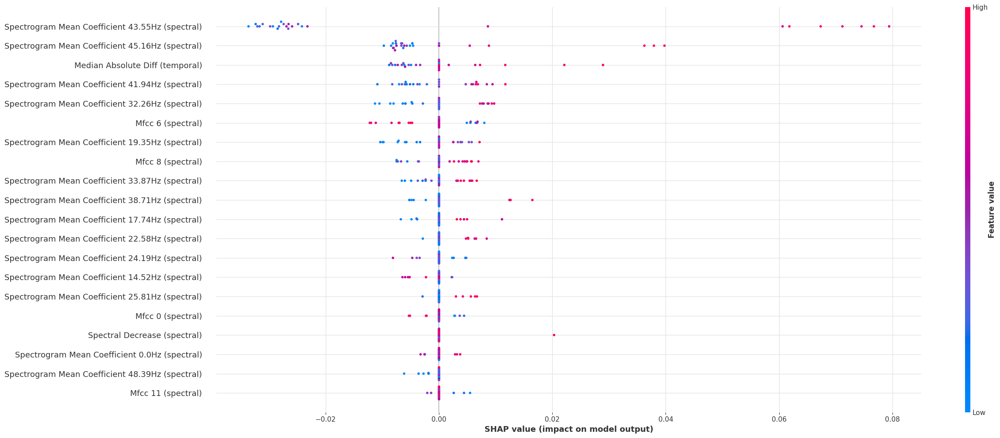

In [95]:
%matplotlib inline
exp.show()